# **heart-disease**

# Load the Data

In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("oktayrdeki/heart-disease", force_download=True)

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/heart-disease


In [5]:
import pandas as pd

df = pd.read_csv("/kaggle/input/heart-disease/heart_disease.csv")
df.head()

,Age,Gender,Blood Pressure,Cholesterol Level,Exercise Habits,Smoking,Family Heart Disease,Diabetes,BMI,High Blood Pressure,...,High LDL Cholesterol,Alcohol Consumption,Stress Level,Sleep Hours,Sugar Consumption,Triglyceride Level,Fasting Blood Sugar,CRP Level,Homocysteine Level,Heart Disease Status
0,56.0,Male,153.0,155.0,High,Yes,Yes,No,24.991591,Yes,...,No,High,Medium,7.633228,Medium,342.0,NaN,12.969246,12.387250,No
1,69.0,Female,146.0,286.0,High,No,Yes,Yes,25.221799,No,...,No,Medium,High,8.744034,Medium,133.0,157.0,9.355389,19.298875,No
2,46.0,Male,126.0,216.0,Low,No,No,No,29.855447,No,...,Yes,Low,Low,4.440440,Low,393.0,92.0,12.709873,11.230926,No
3,32.0,Female,122.0,293.0,High,Yes,Yes,No,24.130477,Yes,...,Yes,Low,High,5.249405,High,293.0,94.0,12.509046,5.961958,No
4,60.0,Male,166.0,242.0,Low,Yes,Yes,Yes,20.486289,Yes,...,No,Low,High,7.030971,High,263.0,154.0,10.381259,8.153887,No


In [ ]:
df.describe()

,Age,Blood Pressure,Cholesterol Level,BMI,Sleep Hours,Triglyceride Level,Fasting Blood Sugar,CRP Level,Homocysteine Level
count,9971.000000,9981.000000,9970.000000,9978.000000,9975.000000,9974.000000,9978.000000,9974.000000,9980.000000
mean,49.296259,149.757740,225.425577,29.077269,6.991329,250.734409,120.142213,7.472201,12.456271
std,18.193970,17.572969,43.575809,6.307098,1.753195,87.067226,23.584011,4.340248,4.323426
min,18.000000,120.000000,150.000000,18.002837,4.000605,100.000000,80.000000,0.003647,5.000236
25%,34.000000,134.000000,187.000000,23.658075,5.449866,176.000000,99.000000,3.674126,8.723334
50%,49.000000,150.000000,226.000000,29.079492,7.003252,250.000000,120.000000,7.472164,12.409395
75%,65.000000,165.000000,263.000000,34.520015,8.531577,326.000000,141.000000,11.255592,16.140564
max,80.000000,180.000000,300.000000,39.996954,9.999952,400.000000,160.000000,14.997087,19.999037


In [ ]:
df.describe(include="object")

,Gender,Exercise Habits,Smoking,Family Heart Disease,Diabetes,High Blood Pressure,Low HDL Cholesterol,High LDL Cholesterol,Alcohol Consumption,Stress Level,Sugar Consumption,Heart Disease Status
count,9981,9975,9975,9979,9970,9974,9975,9974,7414,9978,9970,10000
unique,2,3,2,2,2,2,2,2,3,3,3,2
top,Male,High,Yes,No,No,Yes,Yes,No,Medium,Medium,Low,No
freq,5003,3372,5123,5004,5018,5022,5000,5036,2500,3387,3390,8000


In [ ]:
df.isnull().sum()

,0
Age,29
Gender,19
Blood Pressure,19
Cholesterol Level,30
Exercise Habits,25
Smoking,25
Family Heart Disease,21
Diabetes,30
BMI,22
High Blood Pressure,26


In [ ]:
df.shape

(10000, 21)

In [ ]:
df["Alcohol Consumption"].value_counts()

,count
Alcohol Consumption,
Medium,2500
Low,2488
High,2426


## EDA

Crosstab between Gender and Heart Disease:
Heart Disease Status    No   Yes
Gender                          
Female                3948  1030
Male                  4034   969


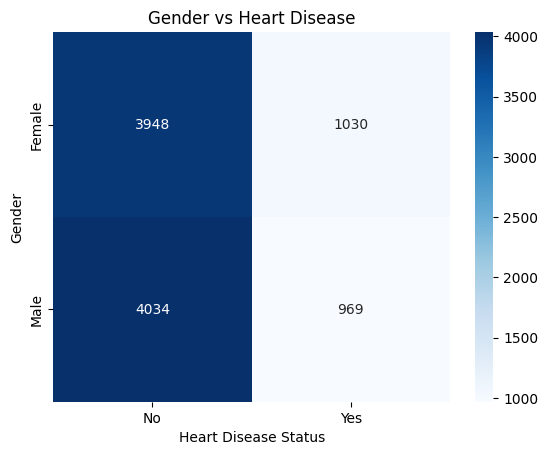


Chi-squared test between Gender and Heart Disease:
Chi-squared Statistic: 2.6434596723857933
P-value: 0.1039768934515038
Degrees of Freedom: 1
Expected Frequencies:
[[3981.00350666  996.99649334]
 [4000.99649334 1002.00350666]]

Crosstab between Alcohol Consumption and Heart Disease:
Heart Disease Status    No  Yes
Alcohol Consumption            
High                  1917  509
Low                   1980  508
Medium                2014  486


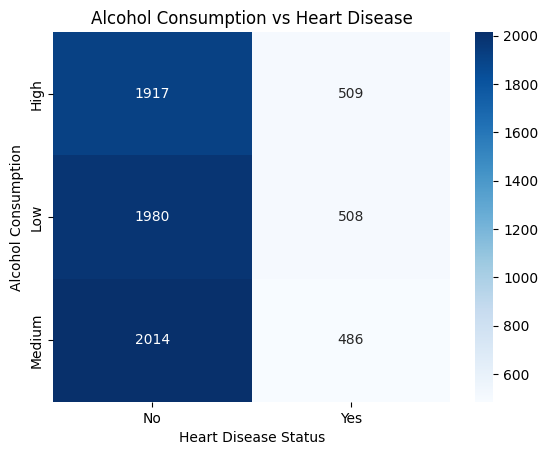


Chi-squared test between Alcohol Consumption and Heart Disease:
Chi-squared Statistic: 1.8581231793139326
P-value: 0.39492413743340565
Degrees of Freedom: 2


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Correlation between 'Gender' and 'Heart Disease'
# For two categorical variables, we can use a confusion matrix or a chi-squared test.
# Here, we'll use a crosstab to see the counts.

crosstab_result = pd.crosstab(df['Gender'], df['Heart Disease Status'])
print("Crosstab between Gender and Heart Disease:")
print(crosstab_result)

# We can visualize this using a heatmap
sns.heatmap(crosstab_result, annot=True, fmt="d", cmap="Blues")
plt.title('Gender vs Heart Disease')
plt.show()

# For measuring association strength, you could consider Cramer's V or the Chi-squared test p-value.
# Let's demonstrate with a chi-squared test (requires scipy)
!pip install scipy
from scipy.stats import chi2_contingency

chi2, p, dof, expected = chi2_contingency(crosstab_result)

print(f"\nChi-squared test between Gender and Heart Disease:")
print(f"Chi-squared Statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of Freedom: {dof}")
print(f"Expected Frequencies:\n{expected}")

# Interpret the p-value: A low p-value (e.g., < 0.05) suggests a statistically significant association.

# You can apply similar logic to other pairs of categorical features like 'Alcohol Consumption' and 'Heart Disease'
crosstab_chestpain_heartdisease = pd.crosstab(df['Alcohol Consumption'], df['Heart Disease Status'])
print("\nCrosstab between Alcohol Consumption and Heart Disease:")
print(crosstab_chestpain_heartdisease)

sns.heatmap(crosstab_chestpain_heartdisease, annot=True, fmt="d", cmap="Blues")
plt.title('Alcohol Consumption vs Heart Disease')
plt.show()

chi2_cp, p_cp, dof_cp, expected_cp = chi2_contingency(crosstab_chestpain_heartdisease)

print(f"\nChi-squared test between Alcohol Consumption and Heart Disease:")
print(f"Chi-squared Statistic: {chi2_cp}")
print(f"P-value: {p_cp}")
print(f"Degrees of Freedom: {dof_cp}")
# print(f"Expected Frequencies:\n{expected_cp}") # Optional: uncomment to see expected frequencies




Crosstab between Alcohol Consumption and Smoking:
Smoking                No   Yes
Alcohol Consumption            
High                 1161  1260
Low                  1206  1276
Medium               1217  1277


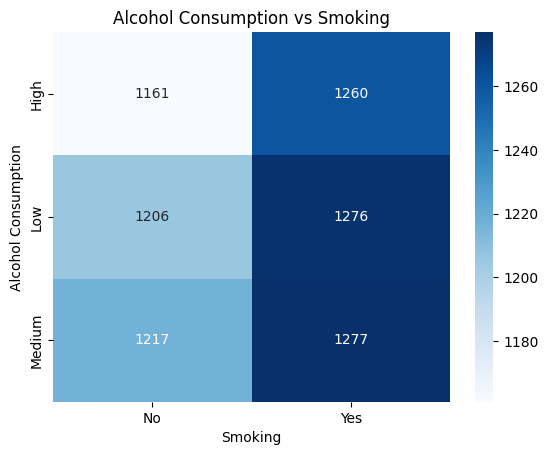

In [ ]:
crosstab_chestpain_heartdisease = pd.crosstab(df['Alcohol Consumption'], df['Smoking'])
print("\nCrosstab between Alcohol Consumption and Smoking:")
print(crosstab_chestpain_heartdisease)

sns.heatmap(crosstab_chestpain_heartdisease, annot=True, fmt="d", cmap="Blues")
plt.title('Alcohol Consumption vs Smoking')
plt.show()


Crosstab between Smoking, Alcohol Consumption, and Heart Disease Status (MultiIndex):
Heart Disease Status           No  Yes
Smoking Alcohol Consumption           
No      High                  929  232
        Low                   954  252
        Medium                981  236
Yes     High                  986  274
        Low                  1022  254
        Medium               1028  249


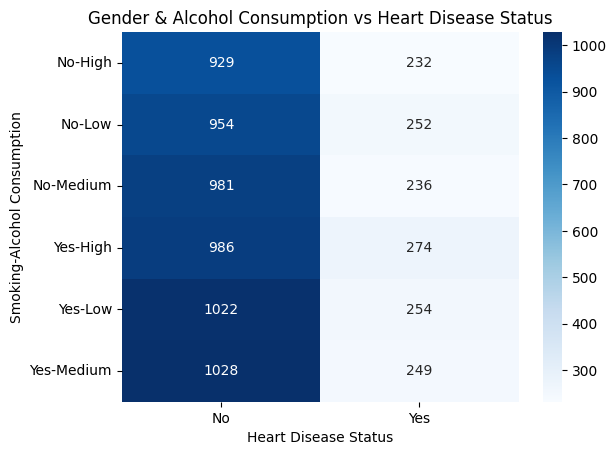

In [ ]:
# Crosstab with multiple columns as index
crosstab_multi_index = pd.crosstab([df['Smoking'], df['Alcohol Consumption']], df['Heart Disease Status'])
print("\nCrosstab between Smoking, Alcohol Consumption, and Heart Disease Status (MultiIndex):")
print(crosstab_multi_index)

# Visualize the multi-index crosstab (optional, can be complex depending on data)
sns.heatmap(crosstab_multi_index, annot=True, fmt="d", cmap="Blues")
plt.title('Gender & Alcohol Consumption vs Heart Disease Status')
plt.show()

# # Crosstab with multiple columns as columns
# crosstab_multi_columns = pd.crosstab(df['Heart Disease Status'], [df['Gender'], df['Alcohol Consumption']])
# print("\nCrosstab between Heart Disease Status and Gender, Alcohol Consumption (MultiColumn):")
# crosstab_multi_columns

# Visualize the multi-column crosstab (optional)
# sns.heatmap(crosstab_multi_columns, annot=True, fmt="d", cmap="Blues")
# plt.title('Heart Disease Status vs Gender & Alcohol Consumption')
# plt.show()


## Desampling

In [ ]:
heart_disease_df = df[df['Heart Disease Status'] == 'Yes']
print(heart_disease_df.head())
heart_disease_df.shape

       Age  Gender  Blood Pressure  Cholesterol Level Exercise Habits Smoking  \
8000  59.0  Female           133.0              251.0          Medium     Yes   
8001  41.0    Male           178.0              297.0            High      No   
8002  21.0    Male           166.0              254.0          Medium      No   
8003  61.0    Male           162.0              193.0            High     Yes   
8004  36.0    Male           175.0              249.0             Low      No   

     Family Heart Disease Diabetes        BMI High Blood Pressure  ...  \
8000                  Yes       No  34.007264                 Yes  ...   
8001                  Yes       No  35.282258                  No  ...   
8002                  Yes      Yes  19.653135                 Yes  ...   
8003                  Yes       No  39.781761                 Yes  ...   
8004                   No      Yes  27.528725                 Yes  ...   

     High LDL Cholesterol Alcohol Consumption Stress Level Sleep Hou

(2000, 21)

In [ ]:
df['Heart Disease Status'].value_counts()

,count
Heart Disease Status,
No,8000
Yes,2000


In [ ]:
heart_disease_df_no = df[df['Heart Disease Status'] == 'No'].iloc[0:2000]
# print(heart_disease_df_no.head())
heart_disease_df_no.shape

(2000, 21)

In [ ]:
balanced_df = pd.concat([heart_disease_df, heart_disease_df_no])
balanced_df.shape

(4000, 21)


Crosstab between Smoking, Alcohol Consumption, and Heart Disease Status (MultiIndex):
Heart Disease Status          No  Yes
Smoking Alcohol Consumption          
No      High                 237  232
        Low                  216  252
        Medium               249  236
Yes     High                 260  274
        Low                  248  254
        Medium               254  249


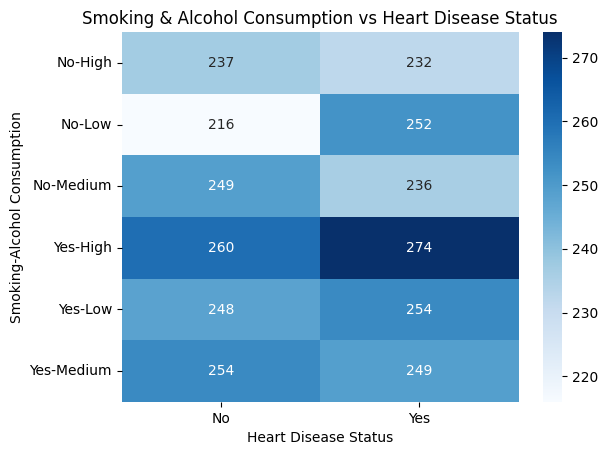

In [ ]:
# Crosstab with multiple columns as index
crosstab_multi_index = pd.crosstab([balanced_df['Smoking'], balanced_df['Alcohol Consumption']], balanced_df['Heart Disease Status'])
print("\nCrosstab between Smoking, Alcohol Consumption, and Heart Disease Status (MultiIndex):")
print(crosstab_multi_index)

# Visualize the multi-index crosstab (optional, can be complex depending on data)
sns.heatmap(crosstab_multi_index, annot=True, fmt="d", cmap="Blues")
plt.title('Smoking & Alcohol Consumption vs Heart Disease Status')
plt.show()


Crosstab between Smoking, Alcohol Consumption:
Alcohol Consumption  High  Low  Medium
Smoking                               
No                    469  468     485
Yes                   534  502     503


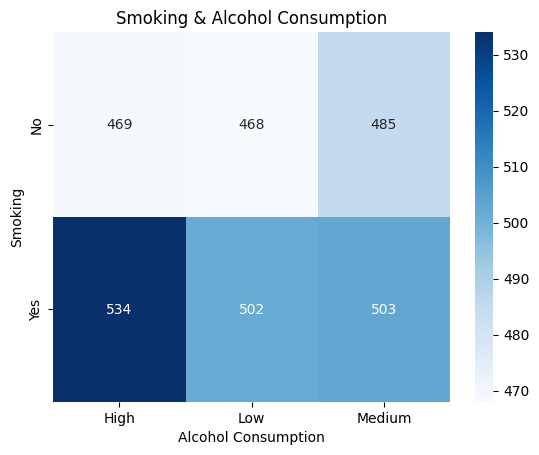

In [ ]:
crosstab_multi_index = pd.crosstab(balanced_df['Smoking'], balanced_df['Alcohol Consumption'])
print("\nCrosstab between Smoking, Alcohol Consumption:")
print(crosstab_multi_index)

# Visualize the multi-index crosstab (optional, can be complex depending on data)
sns.heatmap(crosstab_multi_index, annot=True, fmt="d", cmap="Blues")
plt.title('Smoking & Alcohol Consumption')
plt.show()


Crosstab between Smoking, Alcohol Consumption:
Stress Level                 High  Low  Medium
Smoking Alcohol Consumption                   
No      High                  138  154     176
        Low                   150  144     173
        Medium                153  160     171
Yes     High                  149  183     202
        Low                   175  170     157
        Medium                171  168     162


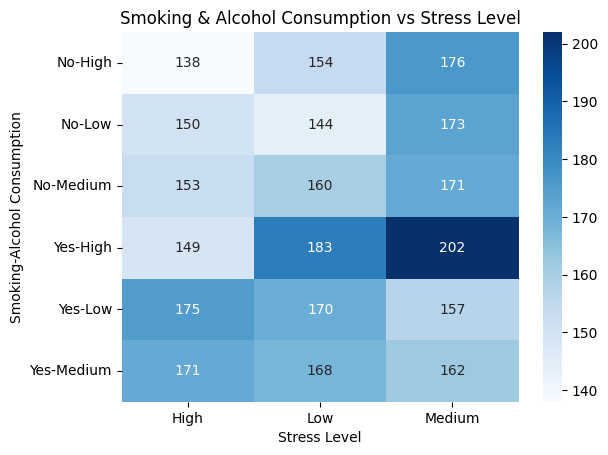

In [ ]:
crosstab_multi_index = pd.crosstab([balanced_df['Smoking'], balanced_df['Alcohol Consumption']], balanced_df["Stress Level"])
print("\nCrosstab between Smoking, Alcohol Consumption:")
print(crosstab_multi_index)

# Visualize the multi-index crosstab (optional, can be complex depending on data)
sns.heatmap(crosstab_multi_index, annot=True, fmt="d", cmap="Blues")
plt.title('Smoking & Alcohol Consumption vs Stress Level')
plt.show()

In [ ]:
balanced_df.describe()

,Age,Blood Pressure,Cholesterol Level,BMI,Sleep Hours,Triglyceride Level,Fasting Blood Sugar,CRP Level,Homocysteine Level
count,3990.000000,3990.000000,3989.000000,3990.000000,3994.000000,3983.000000,3988.000000,3987.000000,3992.000000
mean,49.307769,149.541353,225.561043,29.160794,6.996183,250.894552,119.864845,7.477437,12.451169
std,18.183006,17.400368,43.180560,6.306630,1.748851,87.106013,23.573525,4.268719,4.327705
min,18.000000,120.000000,150.000000,18.008757,4.000605,100.000000,80.000000,0.008811,5.001209
25%,34.000000,134.000000,189.000000,23.744462,5.491194,176.500000,99.000000,3.729865,8.717513
50%,49.000000,149.000000,225.000000,29.283231,7.008028,250.000000,119.000000,7.460889,12.423770
75%,65.000000,165.000000,263.000000,34.621428,8.503085,326.000000,141.000000,11.104670,16.152822
max,80.000000,180.000000,300.000000,39.988846,9.999151,400.000000,160.000000,14.996625,19.998759


In [ ]:
balanced_df.describe(include=object)

,Gender,Exercise Habits,Smoking,Family Heart Disease,Diabetes,High Blood Pressure,Low HDL Cholesterol,High LDL Cholesterol,Alcohol Consumption,Stress Level,Sugar Consumption,Heart Disease Status
count,3995,3991,3989,3988,3986,3989,3995,3992,2970,3990,3985,4000
unique,2,3,2,2,2,2,2,2,3,3,3,2
top,Female,Medium,Yes,No,No,Yes,No,Yes,High,Medium,High,Yes
freq,2029,1352,2065,2045,2025,2023,2015,1999,1006,1401,1341,2000


In [ ]:
categorical_cols = balanced_df.select_dtypes(include='object').columns
print("Categorical columns:")
categorical_cols

Categorical columns:


Index(['Gender', 'Exercise Habits', 'Smoking', 'Family Heart Disease',
       'Diabetes', 'High Blood Pressure', 'Low HDL Cholesterol',
       'High LDL Cholesterol', 'Alcohol Consumption', 'Stress Level',
       'Sugar Consumption', 'Heart Disease Status'],
      dtype='object')

In [ ]:
balanced_df[list(categorical_cols[:-1])].head()

,Gender,Exercise Habits,Smoking,Family Heart Disease,Diabetes,High Blood Pressure,Low HDL Cholesterol,High LDL Cholesterol,Alcohol Consumption,Stress Level,Sugar Consumption
8000,Female,Medium,Yes,Yes,No,Yes,No,Yes,NaN,High,High
8001,Male,High,No,Yes,No,No,Yes,Yes,NaN,Medium,High
8002,Male,Medium,No,Yes,Yes,Yes,Yes,Yes,High,Medium,High
8003,Male,High,Yes,Yes,No,Yes,No,No,Low,Medium,High
8004,Male,Low,No,No,Yes,Yes,No,Yes,Low,High,Medium


In [ ]:
crosstab_multi_index = pd.crosstab([balanced_df[list(categorical_cols[:-1])]], balanced_df["Heart Disease Status"])
print("\nCrosstab between Smoking, Alcohol Consumption:")
print(crosstab_multi_index)

# Visualize the multi-index crosstab (optional, can be complex depending on data)
sns.heatmap(crosstab_multi_index, annot=True, fmt="d", cmap="Blues")
plt.title('Smoking & Alcohol Consumption vs Stress Level')
plt.show()

ValueError: 2

## Decision Tree

Accuracy: 0.5025
Classification Report:
              precision    recall  f1-score   support

          No       0.48      0.51      0.49       378
         Yes       0.53      0.50      0.51       422

    accuracy                           0.50       800
   macro avg       0.50      0.50      0.50       800
weighted avg       0.50      0.50      0.50       800



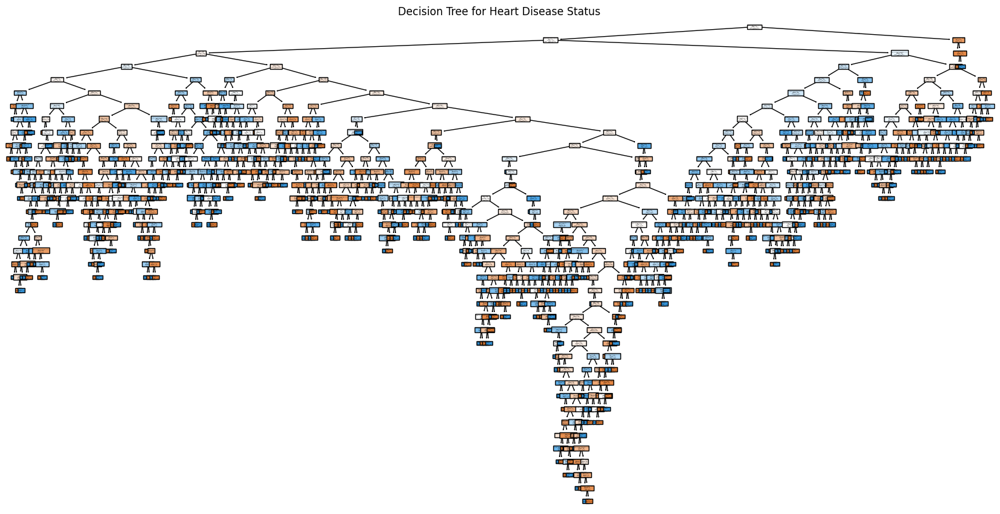

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report

# Separate features (X) and target (y)
X = balanced_df.drop('Heart Disease Status', axis=1)
y = balanced_df['Heart Disease Status']

# Convert categorical variables to numerical using one-hot encoding
X = pd.get_dummies(X, columns=categorical_cols[:-1], drop_first=True)

# Encode the target variable
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Initialize the Decision Tree Classifier
# You can adjust parameters like max_depth, min_samples_split, etc.
dt_classifier = DecisionTreeClassifier(random_state=42)

# Train the classifier
dt_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = dt_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=le.classes_)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(report)

# Visualize the Decision Tree (optional, can be large)
plt.figure(figsize=(20,10))
plot_tree(dt_classifier, feature_names=X.columns, class_names=le.classes_, filled=True)
plt.title("Decision Tree for Heart Disease Status")
plt.show()

In [ ]:
# Visualize the Decision Tree (optional, can be large)
plt.figure(figsize=(300,200))
plot_tree(dt_classifier, feature_names=X.columns, class_names=le.classes_, filled=True)
plt.title("Decision Tree for Heart Disease Status")
plt.savefig("decision_tree_heart_disease.png")
plt.show()

In [ ]:
# move file to drive

!cp /content/decision_tree_heart_disease.png "/content/drive/MyDrive/DSAI MTech/AI - Capstone Project Sem3/"

## Draft 2

In [6]:
df.head()

,Age,Gender,Blood Pressure,Cholesterol Level,Exercise Habits,Smoking,Family Heart Disease,Diabetes,BMI,High Blood Pressure,...,High LDL Cholesterol,Alcohol Consumption,Stress Level,Sleep Hours,Sugar Consumption,Triglyceride Level,Fasting Blood Sugar,CRP Level,Homocysteine Level,Heart Disease Status
0,56.0,Male,153.0,155.0,High,Yes,Yes,No,24.991591,Yes,...,No,High,Medium,7.633228,Medium,342.0,NaN,12.969246,12.387250,No
1,69.0,Female,146.0,286.0,High,No,Yes,Yes,25.221799,No,...,No,Medium,High,8.744034,Medium,133.0,157.0,9.355389,19.298875,No
2,46.0,Male,126.0,216.0,Low,No,No,No,29.855447,No,...,Yes,Low,Low,4.440440,Low,393.0,92.0,12.709873,11.230926,No
3,32.0,Female,122.0,293.0,High,Yes,Yes,No,24.130477,Yes,...,Yes,Low,High,5.249405,High,293.0,94.0,12.509046,5.961958,No
4,60.0,Male,166.0,242.0,Low,Yes,Yes,Yes,20.486289,Yes,...,No,Low,High,7.030971,High,263.0,154.0,10.381259,8.153887,No


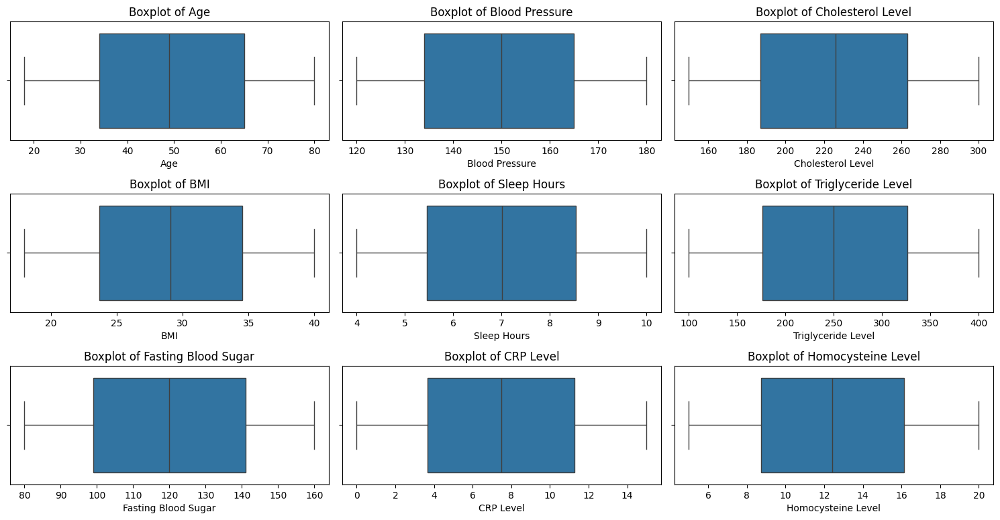

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
# Select numerical columns for outlier analysis
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Plotting boxplots for each numerical column
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
  plt.subplot(len(numerical_cols)//3 + 1, 3, i + 1)
  sns.boxplot(x=df[col])
  plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

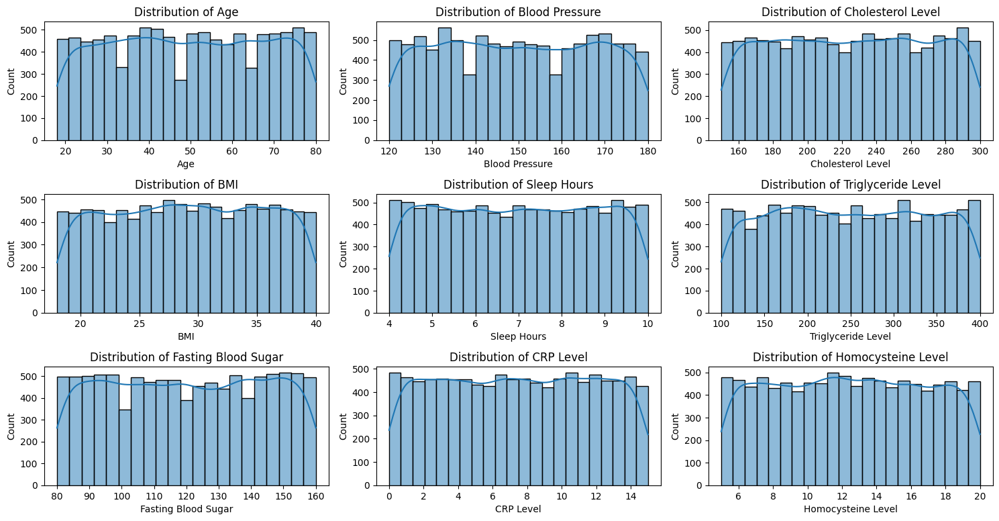

In [10]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols)//3 + 1, 3, i + 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()


In [12]:
df.shape

(10000, 21)

In [14]:
df.isnull().sum() / df.shape[0]

,0
Age,0.0029
Gender,0.0019
Blood Pressure,0.0019
Cholesterol Level,0.0030
Exercise Habits,0.0025
Smoking,0.0025
Family Heart Disease,0.0021
Diabetes,0.0030
BMI,0.0022
High Blood Pressure,0.0026


In [15]:
df["Heart Disease Status"].value_counts()

,count
Heart Disease Status,
No,8000
Yes,2000


In [20]:
bdf = df.dropna(subset=["Alcohol Consumption"])
bdf.shape

(7414, 21)

In [17]:
bdf.isnull().sum()

,0
Age,18
Gender,13
Blood Pressure,14
Cholesterol Level,26
Exercise Habits,16
Smoking,17
Family Heart Disease,19
Diabetes,28
BMI,18
High Blood Pressure,20


In [18]:
bdf["Heart Disease Status"].value_counts()

,count
Heart Disease Status,
No,5911
Yes,1503


In [19]:
hydf = bdf[bdf["Heart Disease Status"] == "Yes"]
hndf = bdf[bdf["Heart Disease Status"] == "No"]
hydf.shape, hndf.shape


((1503, 21), (5911, 21))

In [21]:
hndf_resampled = hndf.sample(n=len(hydf), random_state=42)
hndf_resampled.shape

(1503, 21)

In [22]:
balanced_df = pd.concat([hydf, hndf_resampled])
balanced_df.shape

(3006, 21)

In [23]:
balanced_df.isnull().sum()

,0
Age,9
Gender,1
Blood Pressure,5
Cholesterol Level,12
Exercise Habits,2
Smoking,8
Family Heart Disease,9
Diabetes,8
BMI,6
High Blood Pressure,10


In [25]:
dropna_df = balanced_df.dropna()
dropna_df.shape

(2863, 21)

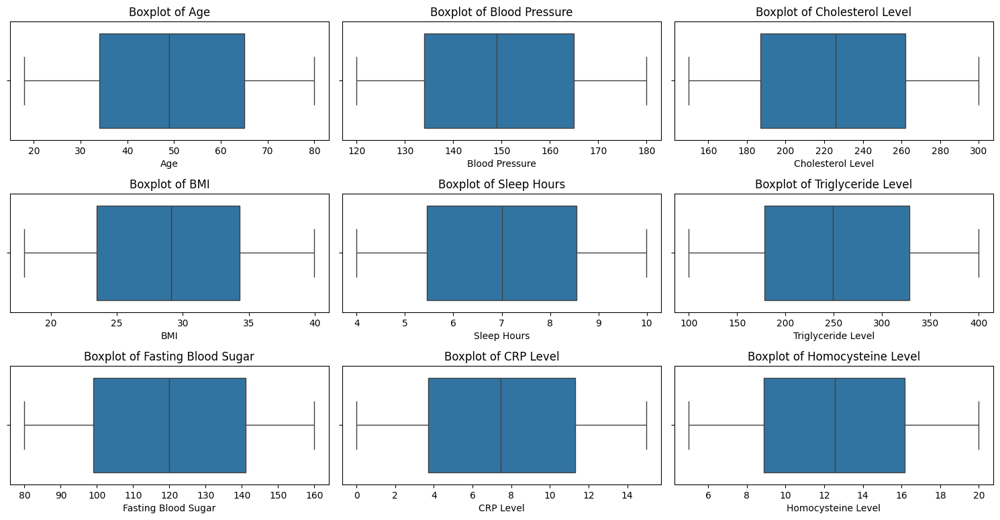

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
# Select numerical columns for outlier analysis
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Plotting boxplots for each numerical column
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
  plt.subplot(len(numerical_cols)//3 + 1, 3, i + 1)
  sns.boxplot(x=balanced_df[col])
  plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

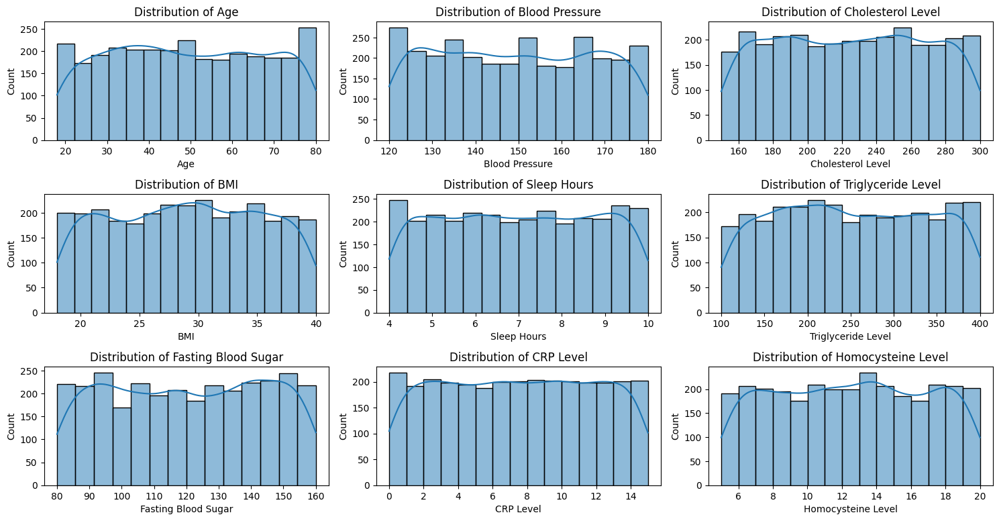

In [28]:

import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols)//3 + 1, 3, i + 1)
    sns.histplot(balanced_df[col], kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

In [30]:
# Get columns with exactly 2 unique values
cols_with_two_uniques = [col for col in balanced_df.columns if balanced_df[col].nunique() == 2]
cols_with_three_uniques = [col for col in balanced_df.columns if balanced_df[col].nunique() == 3]

print("Columns with exactly 2 unique values:")
cols_with_two_uniques

Columns with exactly 2 unique values:


['Gender',
 'Smoking',
 'Family Heart Disease',
 'Diabetes',
 'High Blood Pressure',
 'Low HDL Cholesterol',
 'High LDL Cholesterol',
 'Heart Disease Status']

In [31]:
print("Columns with exactly 3 unique values:")
cols_with_three_uniques

Columns with exactly 3 unique values:


['Exercise Habits', 'Alcohol Consumption', 'Stress Level', 'Sugar Consumption']

In [32]:
Target_Column = "Heart Disease Status"


In [34]:
data = dict()

for col in cols_with_two_uniques:
  data[col] = str(df[col].unique())

data

{'Gender': "['Male' 'Female' nan]",
 'Smoking': "['Yes' 'No' nan]",
 'Family Heart Disease': "['Yes' 'No' nan]",
 'Diabetes': "['No' 'Yes' nan]",
 'High Blood Pressure': "['Yes' 'No' nan]",
 'Low HDL Cholesterol': "['Yes' 'No' nan]",
 'High LDL Cholesterol': "['No' 'Yes' nan]",
 'Heart Disease Status': "['No' 'Yes']"}

In [36]:
# Identify columns with missing values
cols_with_missing = balanced_df.columns[balanced_df.isnull().any()].tolist()
print("Columns with missing values:", cols_with_missing)

# Impute missing numerical values with the median
numerical_cols_with_missing = balanced_df[cols_with_missing].select_dtypes(include=['int64', 'float64']).columns.tolist()
for col in numerical_cols_with_missing:
    median_val = balanced_df[col].median()
    balanced_df[col] = balanced_df[col].fillna(median_val)

# Impute missing categorical values with the mode
categorical_cols_with_missing = balanced_df[cols_with_missing].select_dtypes(include='object').columns.tolist()
for col in categorical_cols_with_missing:
    mode_val = balanced_df[col].mode()[0] # mode() can return multiple values, take the first one
    balanced_df[col] = balanced_df[col].fillna(mode_val)

print("\nMissing values after imputation:")
print(balanced_df.isnull().sum())

Columns with missing values: []

Missing values after imputation:
Age                     0
Gender                  0
Blood Pressure          0
Cholesterol Level       0
Exercise Habits         0
Smoking                 0
Family Heart Disease    0
Diabetes                0
BMI                     0
High Blood Pressure     0
Low HDL Cholesterol     0
High LDL Cholesterol    0
Alcohol Consumption     0
Stress Level            0
Sleep Hours             0
Sugar Consumption       0
Triglyceride Level      0
Fasting Blood Sugar     0
CRP Level               0
Homocysteine Level      0
Heart Disease Status    0
dtype: int64


In [37]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Separate features (X) and target (y)
X = balanced_df.drop('Heart Disease Status', axis=1)
y = balanced_df['Heart Disease Status']

# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include='object').columns

# Apply StandardScaler to numerical columns
scaler = StandardScaler()
X[numerical_cols] = scaler.fit_transform(X[numerical_cols])

# Apply LabelEncoder to categorical columns (excluding the target variable)
# Note: If you want One-Hot Encoding, use pd.get_dummies instead
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])
    label_encoders[col] = le # Store encoder for inverse transform if needed

# Encode the target variable
le_target = LabelEncoder()
y_encoded = le_target.fit_transform(y)

print("Features (X) after scaling and encoding:")
print(X.head())
print("\nTarget (y) after encoding:")
print(y_encoded[:5])

Features (X) after scaling and encoding:
           Age  Gender  Blood Pressure  Cholesterol Level  Exercise Habits  \
8002 -1.559920       1        0.936374           0.670482                2   
8003  0.655456       1        0.711698          -0.741559                0   
8004 -0.729154       1        1.441896           0.554741                1   
8005 -0.341463       1        1.554234          -1.158228                0   
8007  0.433918       1       -0.748696          -1.644340                1   

      Smoking  Family Heart Disease  Diabetes       BMI  High Blood Pressure  \
8002        0                     1         1 -1.487805                    1   
8003        1                     1         0  1.724470                    1   
8004        0                     0         1 -0.230961                    1   
8005        0                     1         0  0.304901                    1   
8007        0                     0         1 -0.536769                    1   

      Low

# Regression Model

In [39]:
from sklearn.model_selection import train_test_split

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, shuffle=True)

print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_test: {y_test.shape}")

Shape of X_train: (2404, 20)
Shape of X_test: (602, 20)
Shape of y_train: (2404,)
Shape of y_test: (602,)


In [40]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)  # 0 or 1
y_proba = model.predict_proba(X_test)  # Probabilities


In [41]:
model.score(X_test, y_test)

0.48006644518272423

In [42]:
model.score(X_train, y_train)

0.5361896838602329

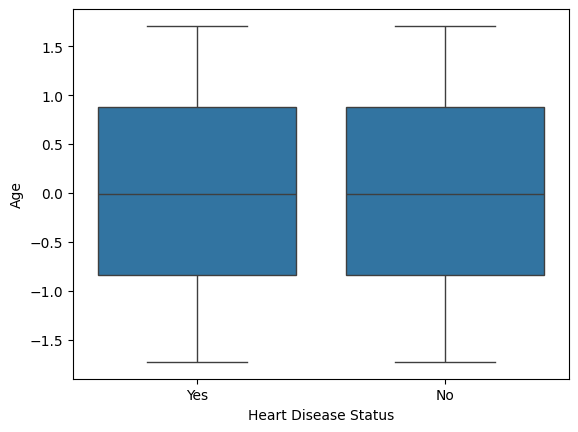

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x=y, y=X['Age'])
plt.show()


In [44]:
X.corr()

,Age,Gender,Blood Pressure,Cholesterol Level,Exercise Habits,Smoking,Family Heart Disease,Diabetes,BMI,High Blood Pressure,Low HDL Cholesterol,High LDL Cholesterol,Alcohol Consumption,Stress Level,Sleep Hours,Sugar Consumption,Triglyceride Level,Fasting Blood Sugar,CRP Level,Homocysteine Level
Age,1.000000,0.002002,-0.020274,0.008356,-0.020902,-0.011554,-0.014225,-0.006626,0.005158,-0.022460,-0.006903,-0.003191,0.017276,0.002947,0.011388,0.029866,-0.010473,0.000584,0.003427,-0.027690
Gender,0.002002,1.000000,-0.003601,-0.001892,0.020738,-0.025829,0.008630,-0.010628,-0.004064,0.022649,0.012694,0.003901,-0.006149,-0.017202,0.021110,0.011333,0.017338,0.016466,-0.009617,-0.003405
Blood Pressure,-0.020274,-0.003601,1.000000,-0.003777,-0.002045,0.009785,0.002278,0.026921,0.002617,-0.011696,-0.001517,0.027547,-0.011384,0.006208,-0.006952,0.020238,0.018970,0.012105,-0.022022,-0.001503
Cholesterol Level,0.008356,-0.001892,-0.003777,1.000000,0.018939,-0.004722,-0.023775,-0.006950,0.048502,-0.022955,-0.017187,-0.005354,0.005055,0.003418,0.006922,0.000297,-0.000329,0.018679,-0.020543,-0.024719
Exercise Habits,-0.020902,0.020738,-0.002045,0.018939,1.000000,-0.016868,-0.002005,0.006884,0.002532,0.013373,0.036911,0.028172,-0.017937,-0.013065,-0.022139,-0.019302,-0.003408,-0.014375,0.014576,-0.014650
Smoking,-0.011554,-0.025829,0.009785,-0.004722,-0.016868,1.000000,-0.005735,0.002433,-0.015883,0.007646,0.011992,0.007872,-0.021409,-0.009132,-0.018711,0.010549,0.016835,-0.013958,0.006004,0.002285
Family Heart Disease,-0.014225,0.008630,0.002278,-0.023775,-0.002005,-0.005735,1.000000,-0.005291,0.017313,0.010694,0.024712,0.011814,0.005275,0.033851,-0.004153,-0.008245,0.001261,-0.023052,0.004897,0.016717
Diabetes,-0.006626,-0.010628,0.026921,-0.006950,0.006884,0.002433,-0.005291,1.000000,-0.001664,0.000623,-0.009397,0.000814,-0.002827,-0.041898,0.009774,0.004164,-0.020064,-0.014157,-0.002298,-0.006575
BMI,0.005158,-0.004064,0.002617,0.048502,0.002532,-0.015883,0.017313,-0.001664,1.000000,0.005345,0.007210,0.025391,-0.019130,-0.005273,-0.019771,-0.007250,0.028256,0.015025,0.008088,-0.004591
High Blood Pressure,-0.022460,0.022649,-0.011696,-0.022955,0.013373,0.007646,0.010694,0.000623,0.005345,1.000000,0.010525,0.000889,-0.019154,0.009686,0.003691,-0.023457,-0.019696,0.021351,0.041440,0.000071


In [46]:
import matplotlib.pyplot as plt
# Fine-tuning the Logistic Regression model
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Define a parameter grid for GridSearchCV
# C: Inverse of regularization strength; smaller values specify stronger regularization.
# penalty: Specify the norm of the penalty ('l2' is common for logistic regression).
# solver: Algorithm to use in the optimization problem. 'liblinear' is good for small datasets.
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l2'], # 'l1' can also be used with 'liblinear' or 'saga'
    'solver': ['liblinear', 'saga'] # 'saga' also supports 'l1' and elasticnet penalties
}

# Initialize the Logistic Regression model
logreg = LogisticRegression(random_state=42, max_iter=1000) # Increased max_iter for saga

# Initialize GridSearchCV
# cv: number of folds for cross-validation
# scoring: metric to evaluate the model ('accuracy', 'roc_auc', etc.)
grid_search = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"\nBest parameters found: {best_params}")
print(f"Best cross-validation accuracy: {best_score}")

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
test_accuracy = best_model.score(X_test, y_test)
y_pred_tuned = best_model.predict(X_test)
report_tuned = classification_report(y_test, y_pred_tuned, target_names=le_target.classes_)

print(f"\nTest set accuracy with best model: {test_accuracy}")
print("Classification Report with best model:")
print(report_tuned)

# Compare with the initial model's test accuracy and report
print("\nComparison with initial Logistic Regression model:")
print(f"Initial Test Accuracy: {model.score(X_test, y_test)}")
print("Initial Classification Report:")
print(classification_report(y_test, model.predict(X_test), target_names=le_target.classes_))

Fitting 5 folds for each of 12 candidates, totalling 60 fits

Best parameters found: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
Best cross-validation accuracy: 0.5112266112266112

Test set accuracy with best model: 0.48006644518272423
Classification Report with best model:
              precision    recall  f1-score   support

          No       0.48      0.53      0.50       297
         Yes       0.49      0.43      0.46       305

    accuracy                           0.48       602
   macro avg       0.48      0.48      0.48       602
weighted avg       0.48      0.48      0.48       602


Comparison with initial Logistic Regression model:
Initial Test Accuracy: 0.48006644518272423
Initial Classification Report:
              precision    recall  f1-score   support

          No       0.48      0.53      0.50       297
         Yes       0.49      0.43      0.46       305

    accuracy                           0.48       602
   macro avg       0.48      0.48      0.48     

# Tree Models

Accuracy: 0.49667774086378735
Classification Report:
              precision    recall  f1-score   support

          No       0.49      0.54      0.51       297
         Yes       0.50      0.46      0.48       305

    accuracy                           0.50       602
   macro avg       0.50      0.50      0.50       602
weighted avg       0.50      0.50      0.50       602



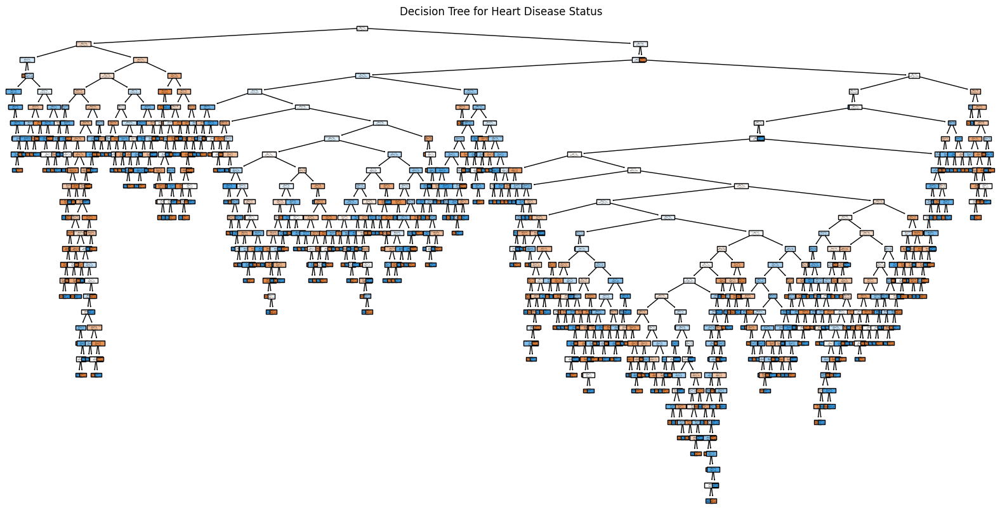

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report

# Initialize the Decision Tree Classifier
# You can adjust parameters like max_depth, min_samples_split, etc.
dt_classifier = DecisionTreeClassifier(random_state=42)

# Train the classifier
dt_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = dt_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=le_target.classes_)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(report)

# Visualize the Decision Tree (optional, can be large)
plt.figure(figsize=(20,10))
plot_tree(dt_classifier, feature_names=X.columns, class_names=le_target.classes_, filled=True)
plt.title("Decision Tree for Heart Disease Status")
plt.show()

In [49]:
# Fine-tuning the Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# Define a parameter grid for GridSearchCV for Decision Tree
param_grid_dt = {
    'max_depth': [None, 5, 10, 15, 20], # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],    # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],      # Minimum number of samples required to be at a leaf node
    'criterion': ['gini', 'entropy']    # Function to measure the quality of a split
}

# Initialize the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Initialize GridSearchCV for Decision Tree
grid_search_dt = GridSearchCV(dt_classifier, param_grid_dt, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit GridSearchCV to the training data
grid_search_dt.fit(X_train, y_train)

# Get the best parameters and best score for Decision Tree
best_params_dt = grid_search_dt.best_params_
best_score_dt = grid_search_dt.best_score_

print(f"\nBest parameters found for Decision Tree: {best_params_dt}")
print(f"Best cross-validation accuracy for Decision Tree: {best_score_dt}")

# Evaluate the best Decision Tree model on the test set
best_dt_model = grid_search_dt.best_estimator_
test_accuracy_dt = best_dt_model.score(X_test, y_test)
y_pred_tuned_dt = best_dt_model.predict(X_test)
report_tuned_dt = classification_report(y_test, y_pred_tuned_dt, target_names=le_target.classes_)

print(f"\nTest set accuracy with best Decision Tree model: {test_accuracy_dt}")
print("Classification Report with best Decision Tree model:")
print(report_tuned_dt)


Fitting 5 folds for each of 90 candidates, totalling 450 fits

Best parameters found for Decision Tree: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best cross-validation accuracy for Decision Tree: 0.5170530145530146

Test set accuracy with best Decision Tree model: 0.5166112956810631
Classification Report with best Decision Tree model:
              precision    recall  f1-score   support

          No       0.52      0.26      0.35       297
         Yes       0.52      0.77      0.62       305

    accuracy                           0.52       602
   macro avg       0.52      0.51      0.48       602
weighted avg       0.52      0.52      0.48       602



# NNN

In [50]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Build a simple neural network
model = Sequential([
    Dense(16, input_dim=X_train.shape[1], activation='relu'),
    Dense(8, activation='relu'),
    Dense(1, activation='sigmoid')  # sigmoid for binary output
])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │           336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 481 (1.88 KB)

 Trainable params: 481 (1.88 KB)

 Non-trainable params: 0 (0.00 B)

In [51]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=1)


Epoch 1/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5164 - loss: 0.7362 - val_accuracy: 0.4865 - val_loss: 0.7107
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5055 - loss: 0.7039 - val_accuracy: 0.5031 - val_loss: 0.7074
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5026 - loss: 0.7011 - val_accuracy: 0.4802 - val_loss: 0.7076
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5156 - loss: 0.6943 - val_accuracy: 0.4740 - val_loss: 0.7061
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5148 - loss: 0.6931 - val_accuracy: 0.4761 - val_loss: 0.7059
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5347 - loss: 0.6922 - val_accuracy: 0.4719 - val_loss: 0.7065
Epoch 7/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5283 - loss: 0.6940 - val_accuracy: 0.4678 - val_loss: 0.7076
Epoch 8/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5294 - loss: 0.6873 - val_accuracy: 0.4761 - val_loss:

In [52]:
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {accuracy:.4f}')


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5122 - loss: 0.6955 
Test Accuracy: 0.5033


In [53]:

history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5968 - loss: 0.6639 - val_accuracy: 0.4636 - val_loss: 0.7160
Epoch 2/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6130 - loss: 0.6595 - val_accuracy: 0.4678 - val_loss: 0.7170
Epoch 3/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5955 - loss: 0.6638 - val_accuracy: 0.4719 - val_loss: 0.7179
Epoch 4/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6133 - loss: 0.6617 - val_accuracy: 0.4740 - val_loss: 0.7182
Epoch 5/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5924 - loss: 0.6639 - val_accuracy: 0.4740 - val_loss: 0.7187
Epoch 6/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5840 - loss: 0.6671 - val_accuracy: 0.4678 - val_loss: 0.7222
Epoch 7/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6139 - loss: 0.6590 - val_accuracy: 0.4574 - val_loss: 0.7241
Epoch 8/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6309 - loss: 0.6512 - val_accuracy: 0.4865 - val_loss:

In [54]:

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6586 - loss: 0.6112 - val_accuracy: 0.4802 - val_loss: 0.7761
Epoch 2/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6700 - loss: 0.6078 - val_accuracy: 0.4761 - val_loss: 0.7771
Epoch 3/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6656 - loss: 0.6199 - val_accuracy: 0.4782 - val_loss: 0.7811
Epoch 4/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6779 - loss: 0.6040 - val_accuracy: 0.4823 - val_loss: 0.7739
Epoch 5/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6657 - loss: 0.6138 - val_accuracy: 0.4699 - val_loss: 0.7843
Epoch 6/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6620 - loss: 0.6071 - val_accuracy: 0.4740 - val_loss: 0.7782
Epoch 7/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6878 - loss: 0.6003 - val_accuracy: 0.4740 - val_loss: 0.7833
Epoch 8/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6597 - loss: 0.6160 - val_accuracy: 0.4802 - v

In [55]:
# prompt: fine tune the sequential model

from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import RandomizedSearchCV
from tensorflow.keras.optimizers import Adam

# Function to create the model, required for KerasClassifier
def create_model(learning_rate=0.001, neurons_layer1=16, neurons_layer2=8):
    model = Sequential([
        Dense(neurons_layer1, input_dim=X_train.shape[1], activation='relu'),
        Dense(neurons_layer2, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create KerasClassifier wrapper
keras_model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=32, verbose=0)

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'learning_rate': [0.0001, 0.001, 0.01],
    'neurons_layer1': [16, 32, 64],
    'neurons_layer2': [8, 16, 32],
    'epochs': [50, 100, 150],
    'batch_size': [16, 32, 64]
}

# Initialize RandomizedSearchCV
# n_iter: Number of parameter settings that are sampled.
random_search = RandomizedSearchCV(keras_model, param_distributions=param_dist,
                                   n_iter=20, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit RandomizedSearchCV to the training data
random_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params_nn = random_search.best_params_
best_score_nn = random_search.best_score_

print(f"\nBest parameters found for Neural Network: {best_params_nn}")
print(f"Best cross-validation accuracy for Neural Network: {best_score_nn}")

# Evaluate the best Neural Network model on the test set
best_nn_model = random_search.best_estimator_
test_loss_nn, test_accuracy_nn = best_nn_model.evaluate(X_test, y_test, verbose=0)

# Predict probabilities and then convert to binary predictions
y_pred_proba_nn = best_nn_model.predict(X_test)
y_pred_tuned_nn = (y_pred_proba_nn > 0.5).astype(int)

report_tuned_nn = classification_report(y_test, y_pred_tuned_nn, target_names=le_target.classes_)

print(f"\nTest set accuracy with best Neural Network model: {test_accuracy_nn}")
print("Classification Report with best Neural Network model:")
report_tuned_nn

ModuleNotFoundError: No module named 'tensorflow.keras.wrappers.scikit_learn'

In [59]:
!pip install scikeras

In [60]:
# prompt: fine tune the sequential model

from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import RandomizedSearchCV
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import classification_report

# Function to create the model, required for KerasClassifier
def create_model(learning_rate=0.001, neurons_layer1=16, neurons_layer2=8):
    model = Sequential([
        Dense(neurons_layer1, input_dim=X_train.shape[1], activation='relu'),
        Dense(neurons_layer2, activation='relu'),
        Dense(1, activation='sigmoid')  # sigmoid for binary output
    ])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create KerasClassifier wrapper
keras_model = KerasClassifier(model=create_model, epochs=50, batch_size=32, verbose=0)


# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'model__learning_rate': [0.0001, 0.001, 0.01],
    'model__neurons_layer1': [16, 32, 64],
    'model__neurons_layer2': [8, 16, 32],
    'epochs': [50, 100, 150],
    'batch_size': [16, 32, 64]
}

# Initialize RandomizedSearchCV
# n_iter: Number of parameter settings that are sampled.
random_search = RandomizedSearchCV(keras_model, param_distributions=param_dist,
                                   n_iter=20, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit RandomizedSearchCV to the training data
random_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params_nn = random_search.best_params_
best_score_nn = random_search.best_score_

print(f"\nBest parameters found for Neural Network: {best_params_nn}")
print(f"Best cross-validation accuracy for Neural Network: {best_score_nn}")

# Evaluate the best Neural Network model on the test set
best_nn_model = random_search.best_estimator_
test_loss_nn, test_accuracy_nn = best_nn_model.score(X_test, y_test), best_nn_model.score(X_test, y_test)


# Predict probabilities and then convert to binary predictions
y_pred_proba_nn = best_nn_model.predict(X_test)
y_pred_tuned_nn = (y_pred_proba_nn > 0.5).astype(int)

report_tuned_nn = classification_report(y_test, y_pred_tuned_nn, target_names=le_target.classes_)

print(f"\nTest set accuracy with best Neural Network model: {test_accuracy_nn}")
print("Classification Report with best Neural Network model:")
print(report_tuned_nn)

AttributeError: 'super' object has no attribute '__sklearn_tags__'